# **Butterfly Classification**

In [1]:
import numpy as np, pandas as pd
from PIL import Image
import os
import matplotlib.pyplot as plt
import re
from sklearn.preprocessing import LabelEncoder
import tensorflow as tf

2025-09-20 18:30:32.617158: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758393032.812680      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758393032.871614      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
df = pd.read_csv("/kaggle/input/butterfly-image-classification/Training_set.csv")

In [3]:
df.head()

,filename,label
0,Image_1.jpg,SOUTHERN DOGFACE
1,Image_2.jpg,ADONIS
2,Image_3.jpg,BROWN SIPROETA
3,Image_4.jpg,MONARCH
4,Image_5.jpg,GREEN CELLED CATTLEHEART


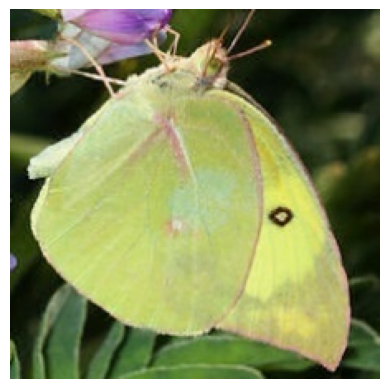

In [4]:
folder_path = "/kaggle/input/butterfly-image-classification/train"
files = os.listdir(folder_path)

def extract_number(f):
    return int(re.search(r'\d+', f).group())

def load_files(folder_path, files):
    data = [] 
    file_name = []
    for i in range(len(files)):
        img = Image.open(os.path.join(folder_path, files[i]))
        data.append(np.array(img))
        file_name.append(files[i])
        df_sort = pd.DataFrame({
            "filename": file_name,
            "data": data
        })
    return df_sort
df_sort = load_files(folder_path,files).sort_values(by="filename",key=lambda x: x.map(extract_number)).reset_index(drop=True)
plt.imshow(df_sort["data"][0])
plt.axis("off")
plt.show()

In [5]:
df_sort

,filename,data
0,Image_1.jpg,"[[[25, 43, 31], [25, 43, 31], [26, 42, 29], [2..."
1,Image_2.jpg,"[[[146, 143, 92], [153, 147, 97], [160, 152, 1..."
2,Image_3.jpg,"[[[236, 232, 229], [236, 232, 229], [236, 232,..."
3,Image_4.jpg,"[[[229, 227, 230], [232, 230, 233], [238, 232,..."
4,Image_5.jpg,"[[[251, 251, 253], [251, 251, 253], [251, 251,..."
...,...,...
6494,Image_6495.jpg,"[[[123, 148, 56], [123, 148, 56], [123, 148, 5..."
6495,Image_6496.jpg,"[[[118, 146, 170], [161, 188, 215], [168, 197,..."
6496,Image_6497.jpg,"[[[35, 62, 21], [35, 62, 21], [36, 63, 20], [3..."
6497,Image_6498.jpg,"[[[236, 236, 234], [235, 235, 233], [235, 235,..."


In [6]:
df["data"] = df_sort["data"]
df.shape

(6499, 3)

In [7]:
df.dtypes

filename    object
label       object
data        object
dtype: object

In [8]:
df

,filename,label,data
0,Image_1.jpg,SOUTHERN DOGFACE,"[[[25, 43, 31], [25, 43, 31], [26, 42, 29], [2..."
1,Image_2.jpg,ADONIS,"[[[146, 143, 92], [153, 147, 97], [160, 152, 1..."
2,Image_3.jpg,BROWN SIPROETA,"[[[236, 232, 229], [236, 232, 229], [236, 232,..."
3,Image_4.jpg,MONARCH,"[[[229, 227, 230], [232, 230, 233], [238, 232,..."
4,Image_5.jpg,GREEN CELLED CATTLEHEART,"[[[251, 251, 253], [251, 251, 253], [251, 251,..."
...,...,...,...
6494,Image_6495.jpg,MANGROVE SKIPPER,"[[[123, 148, 56], [123, 148, 56], [123, 148, 5..."
6495,Image_6496.jpg,MOURNING CLOAK,"[[[118, 146, 170], [161, 188, 215], [168, 197,..."
6496,Image_6497.jpg,APPOLLO,"[[[35, 62, 21], [35, 62, 21], [36, 63, 20], [3..."
6497,Image_6498.jpg,ELBOWED PIERROT,"[[[236, 236, 234], [235, 235, 233], [235, 235,..."


In [9]:
encoder = LabelEncoder()

In [10]:
df["encoded_label"] = encoder.fit_transform(df['label'])
df

,filename,label,data,encoded_label
0,Image_1.jpg,SOUTHERN DOGFACE,"[[[25, 43, 31], [25, 43, 31], [26, 42, 29], [2...",66
1,Image_2.jpg,ADONIS,"[[[146, 143, 92], [153, 147, 97], [160, 152, 1...",0
2,Image_3.jpg,BROWN SIPROETA,"[[[236, 232, 229], [236, 232, 229], [236, 232,...",12
3,Image_4.jpg,MONARCH,"[[[229, 227, 230], [232, 230, 233], [238, 232,...",44
4,Image_5.jpg,GREEN CELLED CATTLEHEART,"[[[251, 251, 253], [251, 251, 253], [251, 251,...",33
...,...,...,...,...
6494,Image_6495.jpg,MANGROVE SKIPPER,"[[[123, 148, 56], [123, 148, 56], [123, 148, 5...",40
6495,Image_6496.jpg,MOURNING CLOAK,"[[[118, 146, 170], [161, 188, 215], [168, 197,...",45
6496,Image_6497.jpg,APPOLLO,"[[[35, 62, 21], [35, 62, 21], [36, 63, 20], [3...",4
6497,Image_6498.jpg,ELBOWED PIERROT,"[[[236, 236, 234], [235, 235, 233], [235, 235,...",29


In [11]:
df["data"] = df["data"]/255

In [12]:
df["data"][0]

array([[[0.09803922, 0.16862745, 0.12156863],
        [0.09803922, 0.16862745, 0.12156863],
        [0.10196078, 0.16470588, 0.11372549],
        ...,
        [0.1372549 , 0.18431373, 0.09019608],
        [0.15686275, 0.20784314, 0.10588235],
        [0.18039216, 0.23137255, 0.12941176]],

       [[0.10196078, 0.17254902, 0.1254902 ],
        [0.09803922, 0.16862745, 0.11372549],
        [0.10196078, 0.16470588, 0.11372549],
        ...,
        [0.18039216, 0.23137255, 0.12941176],
        [0.20784314, 0.24705882, 0.14901961],
        [0.21960784, 0.27058824, 0.16078431]],

       [[0.09411765, 0.17647059, 0.11764706],
        [0.09411765, 0.17647059, 0.10980392],
        [0.09803922, 0.16862745, 0.10588235],
        ...,
        [0.23137255, 0.27058824, 0.16470588],
        [0.24705882, 0.28235294, 0.16862745],
        [0.2627451 , 0.30588235, 0.18823529]],

       ...,

       [[0.23921569, 0.38039216, 0.23921569],
        [0.2627451 , 0.40392157, 0.25490196],
        [0.26666667, 0

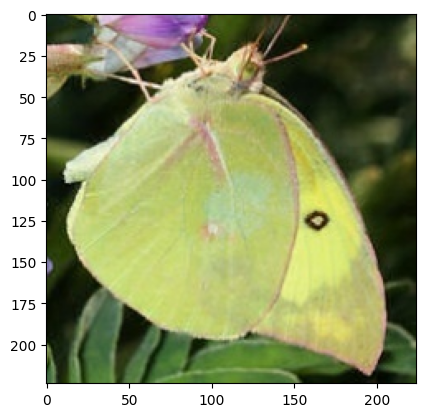

In [13]:
plt.imshow(df["data"][0])

In [14]:
encoder.classes_, df["label"].unique().shape

(array(['ADONIS', 'AFRICAN GIANT SWALLOWTAIL', 'AMERICAN SNOOT', 'AN 88',
        'APPOLLO', 'ATALA', 'BANDED ORANGE HELICONIAN', 'BANDED PEACOCK',
        'BECKERS WHITE', 'BLACK HAIRSTREAK', 'BLUE MORPHO',
        'BLUE SPOTTED CROW', 'BROWN SIPROETA', 'CABBAGE WHITE',
        'CAIRNS BIRDWING', 'CHECQUERED SKIPPER', 'CHESTNUT', 'CLEOPATRA',
        'CLODIUS PARNASSIAN', 'CLOUDED SULPHUR', 'COMMON BANDED AWL',
        'COMMON WOOD-NYMPH', 'COPPER TAIL', 'CRECENT', 'CRIMSON PATCH',
        'DANAID EGGFLY', 'EASTERN COMA', 'EASTERN DAPPLE WHITE',
        'EASTERN PINE ELFIN', 'ELBOWED PIERROT', 'GOLD BANDED',
        'GREAT EGGFLY', 'GREAT JAY', 'GREEN CELLED CATTLEHEART',
        'GREY HAIRSTREAK', 'INDRA SWALLOW', 'IPHICLUS SISTER', 'JULIA',
        'LARGE MARBLE', 'MALACHITE', 'MANGROVE SKIPPER', 'MESTRA',
        'METALMARK', 'MILBERTS TORTOISESHELL', 'MONARCH', 'MOURNING CLOAK',
        'ORANGE OAKLEAF', 'ORANGE TIP', 'ORCHARD SWALLOW', 'PAINTED LADY',
        'PAPER KITE', 'PEACO

1 78 279 329 347 451 460 554 

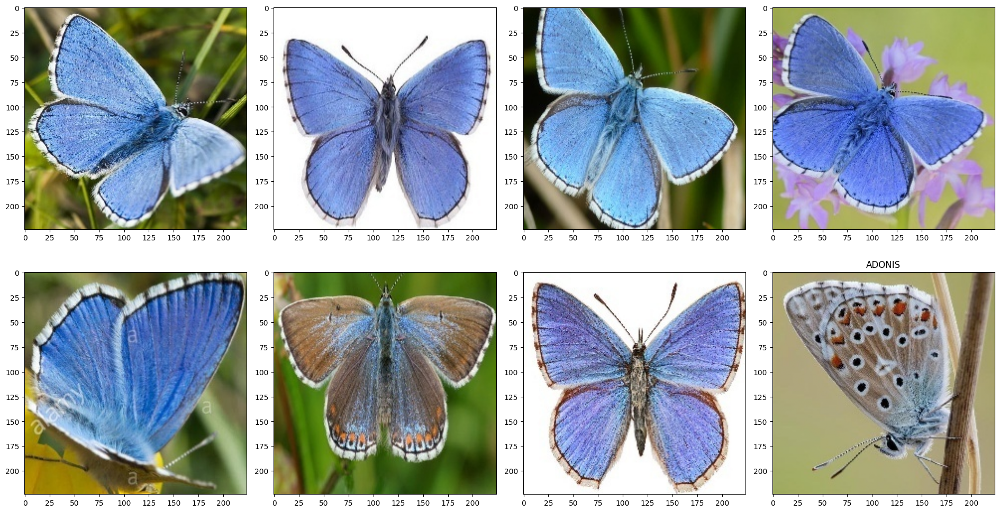

289 373 427 437 465 503 599 620 

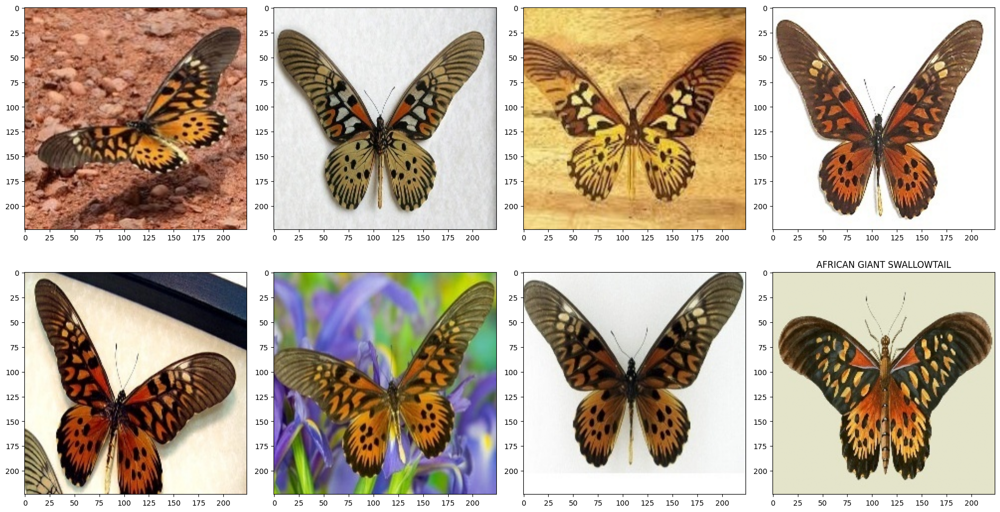

116 238 307 334 386 467 533 562 

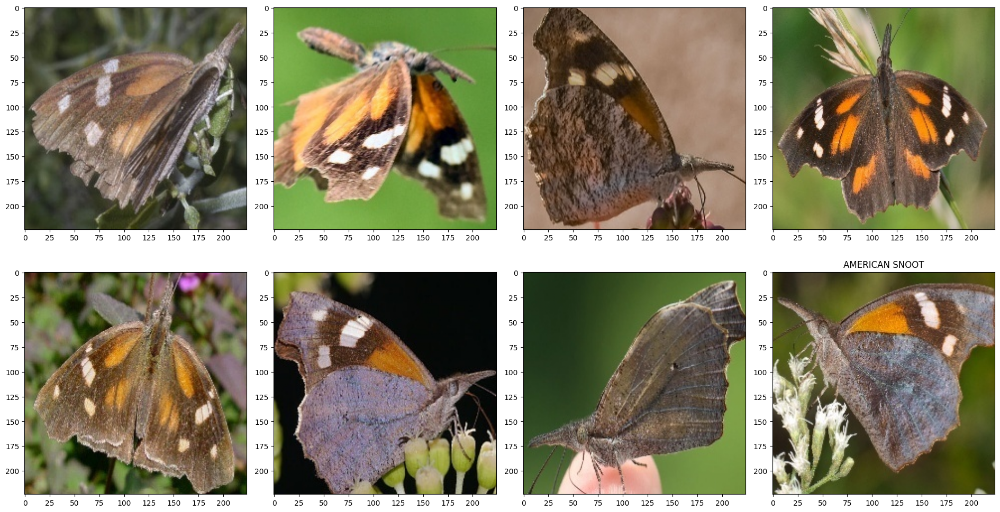

122 320 342 464 534 782 817 883 

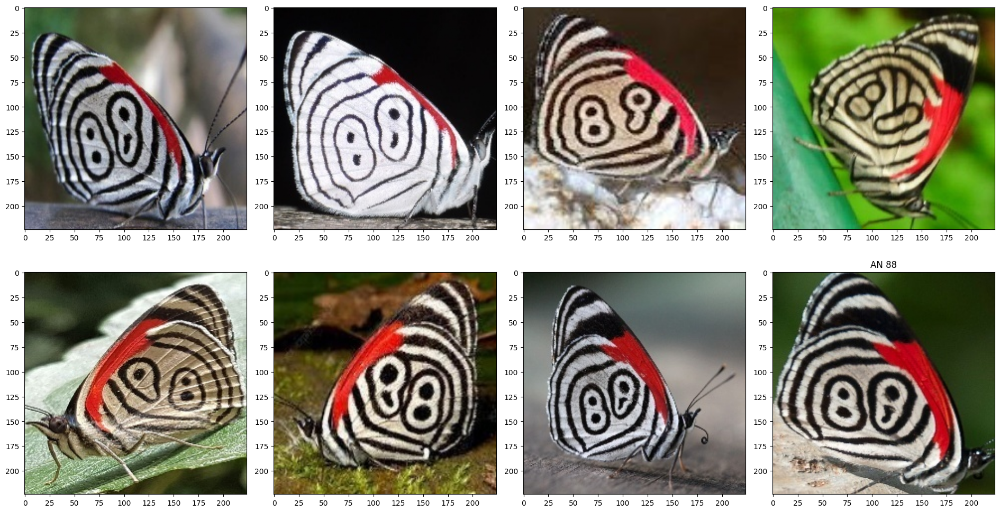

65 85 303 324 416 472 539 550 

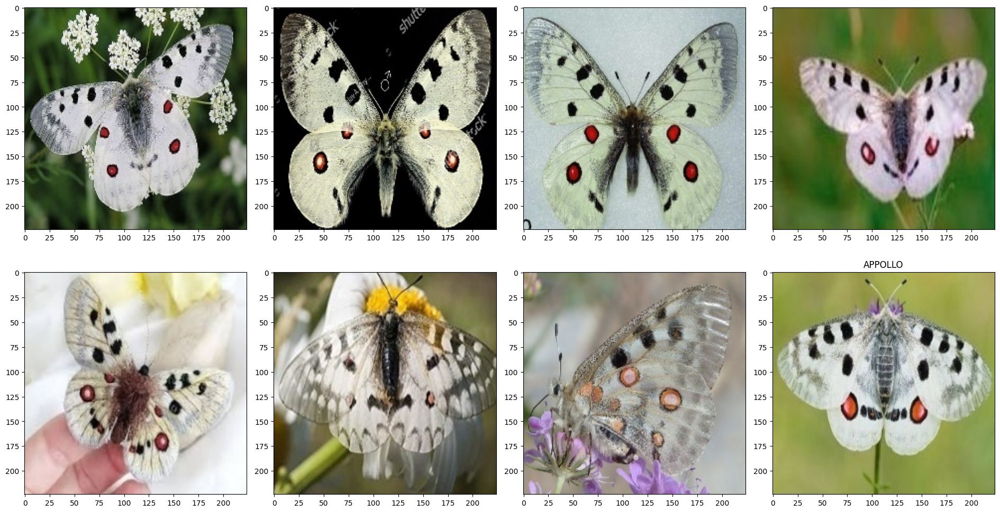

29 71 103 252 258 294 316 348 

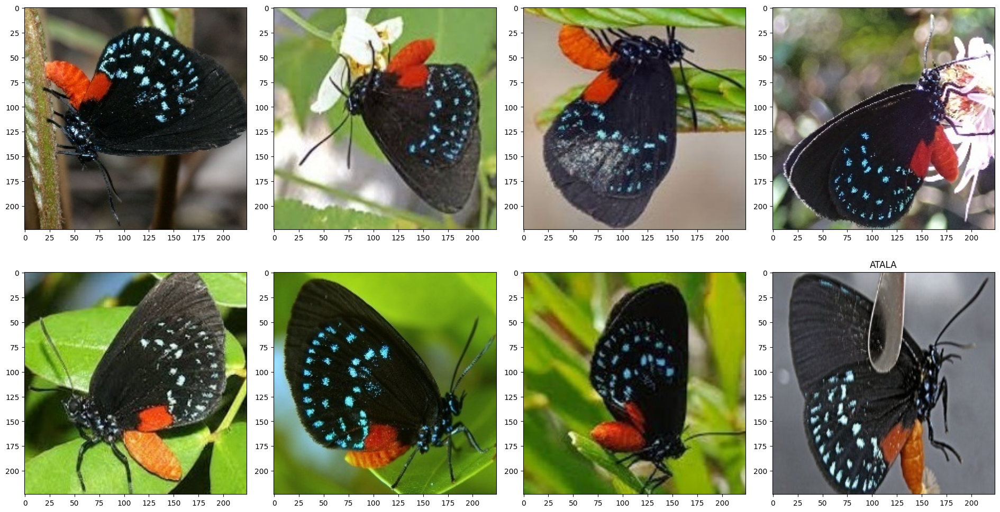

In [15]:
for k in range(6):
    plt.figure(figsize=(19, 100))
    j=0
    for i in df.index[df["encoded_label"]==k][:8].to_list():
        print(i, end=" ")
        ax = plt.subplot(20, 4, j + 1)
        j+=1
        plt.imshow(df["data"][i])
    plt.title(df["label"][i])
    plt.tight_layout()
    plt.show()

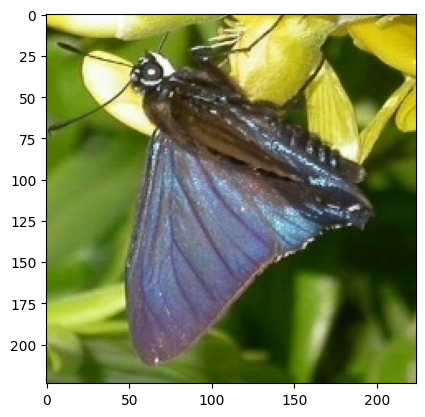

In [16]:
plt.imshow(df["data"][1019])

In [17]:
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape = (224, 224, 3)),
    tf.keras.layers.Dense(1000, activation="relu"),
    tf.keras.layers.Dense(75, activation="softmax")
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
I0000 00:00:1758393144.559767      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


In [18]:
model.compile(optimizer="adam",
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy"])

In [19]:
X = np.array(df["data"].tolist(), dtype="float32")   # make into numeric array
Y = np.array(df["encoded_label"].tolist(), dtype="int32")
model.fit(X,Y,epochs = 10)

Epoch 1/10


I0000 00:00:1758393159.944443      63 service.cc:148] XLA service 0x7e590c008930 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1758393159.945110      63 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1758393160.106528      63 cuda_dnn.cc:529] Loaded cuDNN version 90300


  7/204 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.0154 - loss: 135.2178

I0000 00:00:1758393161.121651      63 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


204/204 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - accuracy: 0.0199 - loss: 86.7900
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.0177 - loss: 4.3123
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.0190 - loss: 4.3127
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.0188 - loss: 4.3007
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.0266 - loss: 4.3162
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.0341 - loss: 4.2734
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.0341 - loss: 4.2552
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.0272 - loss: 4.2754
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.0220 - loss: 4.2976
Epoch 10/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.0327 - loss: 4.2323


In [20]:
from tensorflow.keras.preprocessing import image
img_array = image.img_to_array(X[0]) / 255.0  # normalize (0-1)
img_array = np.expand_dims(img_array, axis=0)  # shape: (1, 224, 224, 3)

# Make prediction
pred = model.predict(img_array)
pred_class = np.argmax(pred, axis=1)  # get class index
pred_class

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 575ms/step


array([45])

66


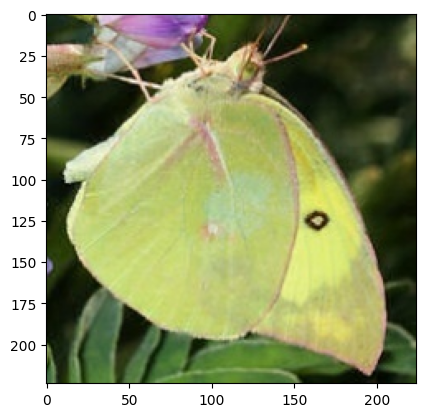

In [21]:
plt.imshow(df['data'][0])
print(df["encoded_label"][0])